# Dissertation Data Analysis

In [1]:
from analysis import plotting
from matplotlib import pyplot as plt
from cartopy import crs as ccrs
from cartopy.io import img_tiles as cimgt
from haversine import Unit, haversine_vector
from matplotlib import pyplot as plt
from matplotlib.figure import Figure
import pandas as pd
from pathlib import Path

In [2]:
datafiles = list(Path("data/input/").glob("*.csv"))

In [3]:
max_lats = []
min_lats = []
max_lons = []
min_lons = []
# get latitude and logitude extents
for file in datafiles:
    df = pd.read_csv(file)
    max_lats.append(df["latitude"].max())
    min_lats.append(df["latitude"].min())
    max_lons.append(df["longitude"].max())
    min_lons.append(df["longitude"].min())

In [4]:
max_lat = max(max_lats)
min_lat = min(min_lats)
max_lon = max(max_lons)
min_lon = min(min_lons)

bounds = plotting.inflate_bounds(min_lon, max_lon, min_lat, max_lat, 0.15)

## Get overall street maps of the dataset

/home/james/Code/strapdown-rs/.pixi/envs/default/lib/python3.13/site-packages/shapely/creation.py:218: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, np.intc(handle_nan), out=out, **kwargs)
/home/james/Code/strapdown-rs/.pixi/envs/default/lib/python3.13/site-packages/shapely/creation.py:218: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, np.intc(handle_nan), out=out, **kwargs)
/home/james/Code/strapdown-rs/.pixi/envs/default/lib/python3.13/site-packages/shapely/creation.py:218: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, np.intc(handle_nan), out=out, **kwargs)
/home/james/Code/strapdown-rs/.pixi/envs/default/lib/python3.13/site-packages/shapely/creation.py:218: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, np.intc(handle_nan), out=out, **kwargs)
/home/james/Code/strapdown-rs/.pixi/envs/default/lib/python3.13/site

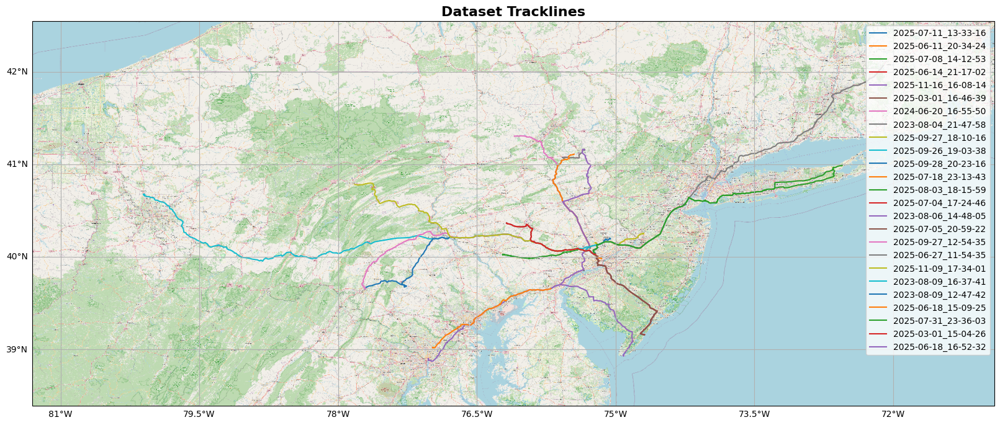

In [5]:
osm_tiles = cimgt.OSM()

fig, ax = plt.subplots(figsize=(20, 10), subplot_kw={"projection": ccrs.PlateCarree()})
ax.set_extent(bounds, crs=ccrs.PlateCarree())
ax.add_image(osm_tiles, 10)
for file in datafiles:
    df = pd.read_csv(file)
    ax.plot(df["longitude"], df["latitude"], transform=ccrs.PlateCarree(), label=file.stem)
    # ax.text(df["longitude"].iloc[0], df["latitude"].iloc[0], label, transform=ccrs.PlateCarree(), fontsize=12, fontweight="bold")

gl = ax.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
ax.legend(loc="upper right")
ax.set_title("Dataset Tracklines", fontsize=16, fontweight="bold")
fig.savefig("data/paths.png", dpi=300)
plt.show()

In [6]:
plt.close()

## Get general summary statistics of the dataset

In [7]:
import haversine as hs
import numpy as np

In [8]:
# Now let's get a summary statistics for each trackline including total distance traveled and duration
from shapely import distance

summary = pd.DataFrame(columns=["distance_km", "duration_seconds"])

for file in datafiles:
    df = pd.read_csv(file)
    trackline = file.stem
    distance_km = hs.haversine_vector(
        df[["latitude", "longitude"]].values,
        df[["latitude", "longitude"]].shift(-1).values,
        Unit.KILOMETERS,
    )
    distance_km = np.nansum(distance_km)
    duration_seconds = (pd.to_datetime(df["time"]).iloc[-1] - pd.to_datetime(df["time"]).iloc[0]).total_seconds()
    summary.loc[trackline] = {"distance_km": distance_km, "duration_seconds": duration_seconds}

summary["duration_hours"] = summary["duration_seconds"] / 3600
summary.loc["median"] = summary.median()
summary.loc["mean"] = summary.mean()
summary.to_csv("data/dataset_summary.csv")

## Get overall geophysical map of the dataset

In [9]:
import pygmt
from pygmt import datasets
from pygmt.params import Position
import xarray as xr

In [10]:
gravity = datasets.load_earth_free_air_anomaly(
    resolution="01m",
    region=bounds,  # [min_lon, max_lon, min_lat, max_lat],
)
magnetic = datasets.load_earth_magnetic_anomaly(
    resolution="03m",
    region=bounds,
    data_source="wdmam",
)
terrain = datasets.load_earth_relief(
    resolution="15s",
    region=bounds,
)

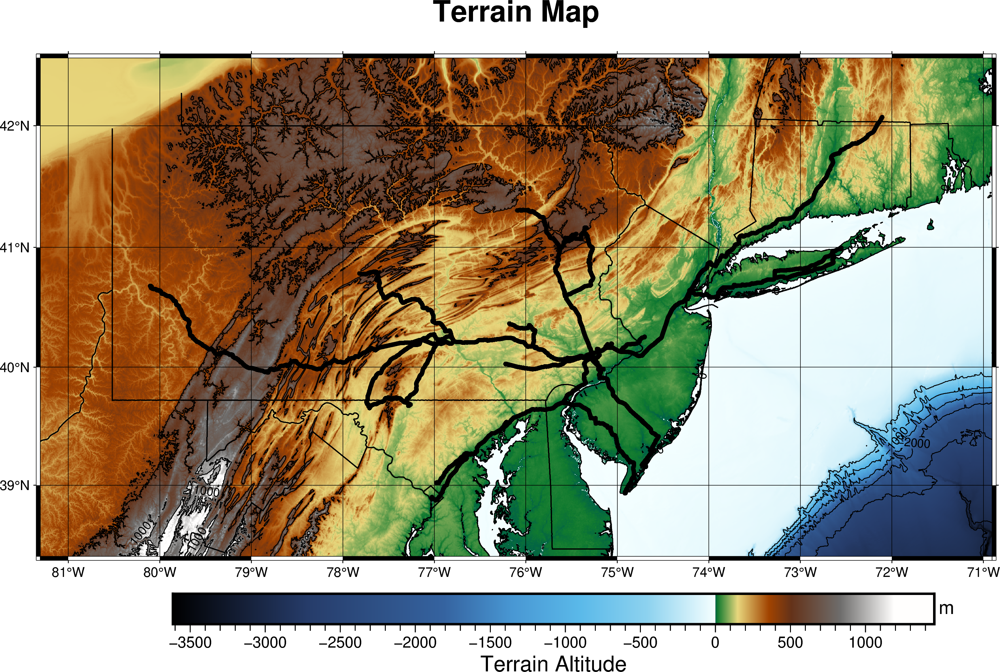

In [ ]:
# Plot all on the terrain map
zmin = terrain.min().item()
zmax = terrain.max().item()
fig = pygmt.Figure()
fig.grdimage(
    terrain,
    cmap="gmt/geo",
    projection="M10i",
    region=bounds,  # [min_lon, max_lon, min_lat, max_lat],
    # shading=True,
    # zscale=0.5,
    # zmin=zmin,
    # zmax=zmax,
)
fig.grdcontour(
    terrain,
    # levels = 500,
    # interval=200,
    # annotation="200+f8p,black",
    annotation=None,
    limit=[zmin, zmax],
    pen="0.5p,black",
)
fig.coast(
    region=bounds,  # [min_lon, max_lon, min_lat, max_lat],
    projection="M10i",
    shorelines="1/0.5p,black",
    borders="2/0.75p,black",
    # water="lightblue",
)
fig.colorbar(
    position="JBC+o1c",
    frame=["af", "x+lTerrain Altitude", "y+lm"],
)

fig.basemap(
    region=bounds,  # [min_lon, max_lon, min_lat, max_lat],
    projection="M10i",
    frame=["ag", "x+lLongitude", "y+lLatitude", "+tTerrain Map"],
)
# Plot the tracklines over the gravity map
for file in datafiles:
    df = pd.read_csv(file)
    fig.plot(
        x=df["longitude"],
        y=df["latitude"],
        style="c0.1c",
        # color="red",
        # pen="0.5p,red",
        label=file.stem,
    )
fig.savefig("data/terrain_map.png", dpi=300)
fig.show()

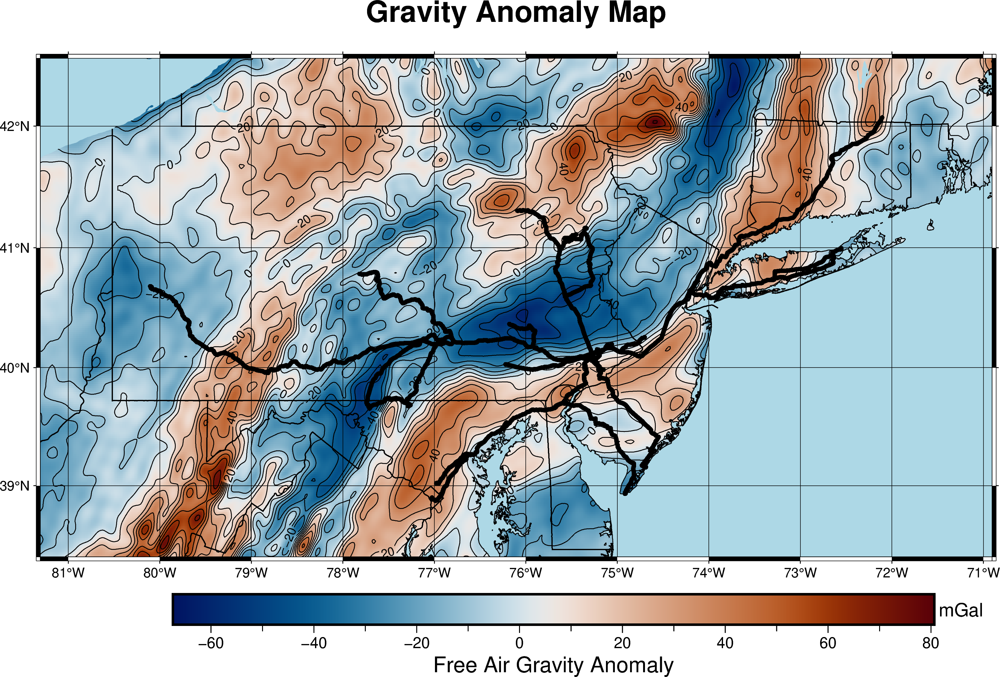

In [12]:
# Plot all on the gravity map
zmin = gravity.min().item()
zmax = gravity.max().item()
fig = pygmt.Figure()
fig.grdimage(
    gravity,
    cmap="vik",
    projection="M10i",
    region=bounds,  # [min_lon, max_lon, min_lat, max_lat],
    # shading=True,
    # zscale=0.5,
    # zmin=zmin,
    # zmax=zmax,
)
fig.grdcontour(
    gravity,
    # levels = 500,
    # interval=200,
    # annotation="200+f8p,black",
    limit=[zmin, zmax],
    pen="0.5p,black",
)
fig.coast(
    region=bounds,  # [min_lon, max_lon, min_lat, max_lat],
    projection="M10i",
    shorelines="1/0.5p,black",
    borders="2/0.75p,black",
    water="lightblue",
)
fig.colorbar(
    position="JBC+o1c",
    frame=["af", "x+lFree Air Gravity Anomaly", "y+lmGal"],
)

fig.basemap(
    region=bounds,  # [min_lon, max_lon, min_lat, max_lat],
    projection="M10i",
    frame=["ag", "x+lLongitude", "y+lLatitude", "+tGravity Anomaly Map"],
)
# Plot the tracklines over the gravity map
for file in datafiles:
    df = pd.read_csv(file)
    fig.plot(
        x=df["longitude"],
        y=df["latitude"],
        style="c0.1c",
        # color="red",
        # pen="0.5p,red",
        label=file.stem,
    )
fig.savefig("data/gravity_map.png", dpi=300)
fig.show()

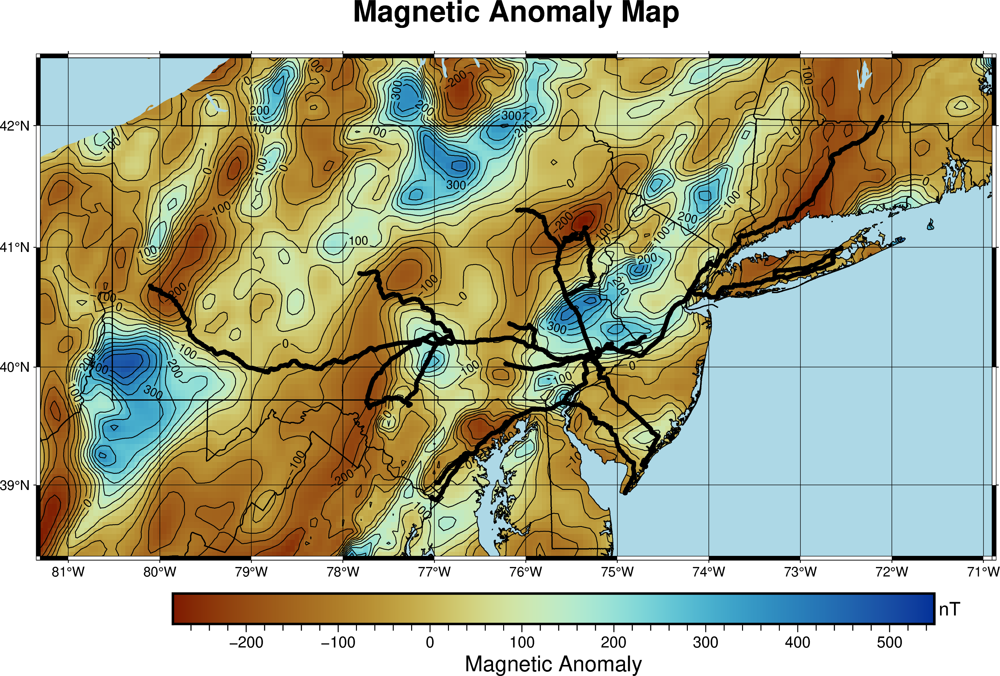

In [13]:
# Plot all on the magnetic map
zmin = magnetic.min().item()
zmax = magnetic.max().item()
fig = pygmt.Figure()
fig.grdimage(
    magnetic,
    cmap="roma",
    projection="M10i",
    region=bounds,  # [min_lon, max_lon, min_lat, max_lat],
    # shading=True,
    # zscale=0.5,
    # zmin=zmin,
    # zmax=zmax,
)
fig.grdcontour(
    magnetic,
    # levels = 500,
    # interval=200,
    # annotation="200+f8p,black",
    limit=[zmin, zmax],
    pen="0.5p,black",
)
fig.coast(
    region=bounds,  # [min_lon, max_lon, min_lat, max_lat],
    projection="M10i",
    shorelines="1/0.5p,black",
    borders="2/0.75p,black",
    water="lightblue",
)
fig.colorbar(
    position="JBC+o1c",
    frame=["af", "x+lMagnetic Anomaly", "y+lnT"],
)

fig.basemap(
    region=bounds,  # [min_lon, max_lon, min_lat, max_lat],
    projection="M10i",
    frame=["ag", "x+lLongitude", "y+lLatitude", "+tMagnetic Anomaly Map"],
)
# Plot the tracklines over the magnetic map
for file in datafiles:
    df = pd.read_csv(file)
    fig.plot(
        x=df["longitude"],
        y=df["latitude"],
        style="c0.1c",
        # color="red",
        # pen="0.5p,red",
        label=file.stem,
    )
fig.savefig("data/magnetic_map.png", dpi=300)
fig.show()